Final Project 1: Self-supervised Video Prediction
(Robot Data)


*   Ruben Vasquez (Matrikel nr: 3340562 ; Email: s6ruvasq@uni-bonn.de)
*   Rohil Rao (Matrikel nr: 3299480 ; Email: s6roraoo@uni-bonn.de)

# Imports




In [ ]:
pip install numpngw

In [ ]:
pip install av

In [ ]:
pip install kornia

     |████████████████████████████████| 276kB 18.5MB/s 


In [ ]:
import matplotlib 
matplotlib.rcParams['figure.dpi'] = 80

In [ ]:
import torch
import torch.nn as nn
from torch.nn import init
import torch.nn.functional as F

from torch.autograd import Variable
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import datasets, models, transforms
from torchvision.models.resnet import ResNet, BasicBlock

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import time, os, copy
from PIL import Image
import natsort
import cv2
import random 


from PIL import Image
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import cv2
from tqdm import tqdm

from kornia.losses import ssim_loss
from torchsummary import summary
from numpngw import write_apng
from torch.autograd import Variable
from torchvision.io import write_video
from torchvision.utils import save_image

## Set Seed

In [ ]:
torch.backends.cudnn.deterministic = True
random.seed(hash("setting random seeds") % 2**32 - 1)
np.random.seed(hash("improves reproducibility") % 2**32 - 1)
torch.manual_seed(hash("by removing stochasticity") % 2**32 - 1)
torch.cuda.manual_seed_all(hash("so runs are repeatable") % 2**32 - 1)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive') #, force_remount = True

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Conv/ LDC

In [ ]:
# Taken from the ResNet pytorch implementation

def Conv3x3(in_planes: int, out_planes: int, stride: int = 1, groups: int = 1, dilation: int = 1) -> nn.Conv2d:
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=dilation, groups=groups, bias=False, dilation=dilation)


def Conv1x1(in_planes: int, out_planes: int, stride: int = 1) -> nn.Conv2d:
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size = 1, stride=stride, bias=False)

In [ ]:
# https://github.com/jacobkimmel/pytorch_convgru/blob/master/convgru.py

class ConvGRUCell(nn.Module):
    """
    Generate a convolutional GRU cell
    """

    def __init__(self, input_size, hidden_size, kernel_size):
        super().__init__()
        padding = kernel_size // 2
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.reset_gate = nn.Conv2d(input_size + hidden_size, hidden_size, kernel_size, padding=padding)
        self.update_gate = nn.Conv2d(input_size + hidden_size, hidden_size, kernel_size, padding=padding) 
        self.out_gate = nn.Conv2d(input_size + hidden_size, hidden_size, kernel_size, padding=padding)

        init.orthogonal_(self.reset_gate.weight)
        init.orthogonal_(self.update_gate.weight)
        init.orthogonal_(self.out_gate.weight)
        init.constant_(self.reset_gate.bias, 0.)
        init.constant_(self.update_gate.bias, 0.)
        init.constant_(self.out_gate.bias, 0.)


    def forward(self, input_, prev_state):

        # get batch and spatial sizes
        batch_size = input_.data.size()[0]
        spatial_size = input_.data.size()[2:]

        # generate empty prev_state, if None is provided
        if prev_state is None:
            state_size = [batch_size, self.hidden_size] + list(spatial_size)
            if torch.cuda.is_available():
                prev_state = Variable(torch.zeros(state_size).to(input_.device))
            else:
                prev_state = Variable(torch.zeros(state_size))

        # data size is [batch, channel, height, width]
        stacked_inputs = torch.cat([input_, prev_state], dim=1)
        update = torch.sigmoid(self.update_gate(stacked_inputs))
        reset = torch.sigmoid(self.reset_gate(stacked_inputs))
        out_inputs = torch.tanh(self.out_gate(torch.cat([input_, prev_state * reset], dim=1)))
        new_state = prev_state * (1 - update) + out_inputs * update

        return new_state

In [ ]:
# https://github.com/AIS-Bonn/LocDepVideoPrediction

class LocationAwareConv2d(torch.nn.Conv2d):
    def __init__(self,locationAware,gradient,w,h,in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True):
        super().__init__(in_channels, out_channels, kernel_size, stride=stride, padding=padding, dilation=dilation, groups=groups, bias=bias)
        if locationAware:
            self.locationBias=torch.nn.Parameter(torch.zeros(w,h,3))
            self.locationEncode=torch.autograd.Variable(torch.ones(w,h,3))
            if gradient:
                for i in range(w):
                    self.locationEncode[i,:,1]=self.locationEncode[:,i,0]=i/float(w-1)
        
        self.up=torch.nn.Upsample(size=(w,h), mode='bilinear', align_corners=False)
        self.w=w
        self.h=h
        self.locationAware=locationAware
    def forward(self,inputs):
        if self.locationAware:
            if self.locationBias.device != inputs.device:
                self.locationBias=self.locationBias.to(device)
            if self.locationEncode.device != inputs.device:
                self.locationEncode=self.locationEncode.to(device)
            b=self.locationBias*self.locationEncode
        convRes=super().forward(inputs)
        if convRes.shape[2]!=self.w and convRes.shape[3]!=self.h:
            convRes=self.up(convRes)
        if self.locationAware:
            return convRes+b[:,:,0]+b[:,:,1]+b[:,:,2]
        else:
            return convRes

# Architecture

In [ ]:
class Project1(ResNet):
  def __init__(self, channels, height, width):
    super(Project1, self).__init__(BasicBlock, [2, 2, 2, 2])

    '''
    Delete fc layer and maxpool layer
    '''
    checkpoint = 'http://download.pytorch.org/models/resnet18-5c106cde.pth'
    self.load_state_dict(torch.hub.load_state_dict_from_url(checkpoint, progress=True))

      
    del self.avgpool
    del self.fc

    '''
    Adapt self.conv1 of Resnet for M-MNIST to check only 1 channel
    '''
    self.conv1 = nn.Conv2d(channels, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    self.relu = nn.ReLU(inplace= False)
    
    '''
    Middle Layer 1 
    '''
    self.m1_conv1x1 =  Conv1x1( in_planes = 64, out_planes = 64)
    self.m1_convgru3x3 = ConvGRUCell(input_size = 64, hidden_size = 64, kernel_size = 3)
    self.m1_convgru5x5 = ConvGRUCell(input_size = 64, hidden_size = 64, kernel_size = 5)
    self.m1_convgru7x7 = ConvGRUCell(input_size = 64, hidden_size = 64, kernel_size = 7)
    
    '''
    Middle Layer 2
    '''
    self.m2_conv1x1 =  Conv1x1( in_planes = 64, out_planes = 64)
    self.m2_convgru3x3 = ConvGRUCell(input_size = 64, hidden_size = 64, kernel_size = 3)
    self.m2_convgru5x5 = ConvGRUCell(input_size = 64, hidden_size = 64, kernel_size = 5)
    self.m2_convgru7x7 = ConvGRUCell(input_size = 64, hidden_size = 64, kernel_size = 7)
    
    '''
    Middle Layer 3
    '''
    self.m3_LDC1x1 =  LocationAwareConv2d(True, True, int(height/8), int(width/8), 128, 64, 1)
    self.m3_convgru3x3 = ConvGRUCell(input_size = 128, hidden_size = 64, kernel_size = 3)
    self.m3_convgru5x5 = ConvGRUCell(input_size = 128, hidden_size = 64, kernel_size = 5)
    self.m3_convgru7x7 = ConvGRUCell(input_size = 128, hidden_size = 64, kernel_size = 7)

    '''
    Middle Layer 4
    '''
    self.m4_LDC1x1 =  LocationAwareConv2d(True, True, int(height/16), int(width/16), 256, 64, 1)
    self.m4_convgru3x3 = ConvGRUCell(input_size = 256, hidden_size = 64, kernel_size = 3)
    self.m4_convgru5x5 = ConvGRUCell(input_size = 256, hidden_size = 64, kernel_size = 5)
    self.m4_convgru7x7 = ConvGRUCell(input_size = 256, hidden_size = 64, kernel_size = 7)


    self.layer5 = nn.Sequential(
                                nn.ReLU(),
                                Conv3x3(512,1024),
                                nn.PixelShuffle(2),
                                Conv3x3(256,64)
                                )
    self.layer6 = nn.Sequential(
                                nn.ReLU(),
                                nn.BatchNorm2d(320),
                                Conv3x3(320,1024),
                                nn.PixelShuffle(2), 
                                Conv3x3(256,64)   
                                )
    
    self.layer7 = nn.Sequential(
                                nn.ReLU(),
                                nn.BatchNorm2d(320),
                                Conv3x3(320,1024),
                                nn.PixelShuffle(2), 
                                Conv3x3(256,64)   
                                )
    
    self.layer8 = nn.Sequential(
                                nn.ReLU(),
                                nn.BatchNorm2d(320),
                                Conv3x3(320,1024),
                                nn.PixelShuffle(2), 
                                Conv3x3(256,64)   
                                )
    
    self.output_layer = nn.Sequential(
                                Conv1x1(320, channels),
                                nn.Upsample(scale_factor = 2, mode = 'nearest')
                                )


  def forward(self,x, hidden_states = [], first_frame = True):
      '''
      For the first frame we initialize the hidden states for the ConvGRUs as None Type.
      ''' 
      if (first_frame == True):
        for i in range(12):
          hidden_states.append(None) 
      
      '''
      Assign the values of hidden states to the variables used in the forward pass logic.
      '''

      h1_1 = hidden_states[0]; h1_2 = hidden_states[1]; h1_3 = hidden_states[2]
      h2_1 = hidden_states[3]; h2_2 = hidden_states[4]; h2_3 = hidden_states[5]
      h3_1 = hidden_states[6]; h3_2 = hidden_states[7]; h3_3 = hidden_states[8]
      h4_1 = hidden_states[9]; h4_2 = hidden_states[10]; h4_3 = hidden_states[11]
        

      '''
      Layer0
      '''
      x_0 = self.conv1(x)

      x_1 = self.bn1(x_0)
      x_1 = self.relu(x_1)
      x_1 = self.maxpool(x_1)

      x_1 = self.layer1(x_1)  
      x_2 = self.layer2(x_1)
      x_3 = self.layer3(x_2)
      x_4 = self.layer4(x_3)

      x_5 = self.layer5(x_4)
      x_m4_LDC1x1 = self.m4_LDC1x1( x_3 )
      x_m4_convgru3x3 = self.m4_convgru3x3( x_3 , h4_1 )
      x_m4_convgru5x5 = self.m4_convgru5x5( x_3 , h4_2 )
      x_m4_convgru7x7 = self.m4_convgru7x7( x_3 , h4_3)
      x_5_cat = torch.cat( (x_5, x_m4_LDC1x1, x_m4_convgru3x3, x_m4_convgru5x5, x_m4_convgru7x7), 1)
      

      x_6 = self.layer6(x_5_cat)
      x_m3_LDC1x1 = self.m3_LDC1x1( x_2 )
      x_m3_convgru3x3 = self.m3_convgru3x3( x_2 , h3_1 )
      x_m3_convgru5x5 = self.m3_convgru5x5( x_2 , h3_2 )
      x_m3_convgru7x7 = self.m3_convgru7x7( x_2 , h3_3 )
      x_6_cat = torch.cat((x_6,  x_m3_LDC1x1, x_m3_convgru3x3, x_m3_convgru5x5, x_m3_convgru7x7), 1)

      x_7 = self.layer7(x_6_cat)
      x_m2_conv1x1 = self.m2_conv1x1( x_1 )
      x_m2_convgru3x3 = self.m2_convgru3x3( x_1 , h2_1)
      x_m2_convgru5x5 = self.m2_convgru5x5( x_1 , h2_2)
      x_m2_convgru7x7 = self.m2_convgru7x7( x_1 , h2_3)
      x_7_cat = torch.cat((x_7, x_m2_conv1x1, x_m2_convgru3x3, x_m2_convgru5x5, x_m2_convgru7x7), 1)

      x_8 = self.layer8(x_7_cat)
      x_m1_conv1x1 = self.m1_conv1x1( x_0 )
      x_m1_convgru3x3 = self.m1_convgru3x3( x_0 , h1_1 )
      x_m1_convgru5x5 = self.m1_convgru5x5( x_0 , h1_2 )
      x_m1_convgru7x7 = self.m1_convgru7x7( x_0 , h1_3 )
      x_8_cat = torch.cat((x_8, x_m1_conv1x1, x_m1_convgru3x3, x_m1_convgru5x5, x_m1_convgru7x7), 1)

      out = self.output_layer(x_8_cat)

      ''' Maintain/Update Hidden States '''
      hidden_states = [x_m1_convgru3x3, x_m1_convgru5x5, x_m1_convgru7x7 , 
                       x_m2_convgru3x3, x_m2_convgru5x5, x_m2_convgru7x7 , 
                       x_m3_convgru3x3, x_m3_convgru5x5, x_m3_convgru7x7 ,
                       x_m4_convgru3x3, x_m4_convgru5x5, x_m4_convgru7x7 ]

      return out, hidden_states

# Dataset

In [ ]:
def Invert_Norm(norm_tensor, mean, std):
  '''
  norm_tensor is normalized tensor
  mean is a list of means for each channel
  std is a list of std for each channel
  '''
  unnorm = norm_tensor.new(*norm_tensor.size())

  unnorm[ 0, :, :] = norm_tensor[ 0, :, :] * std[0] + mean[0]
  unnorm[ 1, :, :] = norm_tensor[ 1, :, :] * std[1] + mean[1]
  unnorm[ 2, :, :] = norm_tensor[ 2, :, :] * std[2] + mean[2]

  return unnorm

In [ ]:
class Robot_Data(Dataset):
  def __init__(self, path,instances, indices, mode = 'Train',transform=None, transfPortion = 0.5):
       
    if mode == 'Train':
      self.total_data = torch.from_numpy(np.load(path + 'ruben_train_smaller.npy')) #.transpose((1,0,2,3))
    elif mode == 'Val':
      self.total_data = torch.from_numpy(np.load(path + 'ruben_val_smaller.npy')) #.transpose((1,0,2,3))
    elif mode == 'Test':
      self.total_data = torch.from_numpy(np.load(path + 'rohil_robot_test.npy')).permute(0,1,4,2,3) #.transpose((1,0,2,3))

    self.indexes = indices
    self.data = self.total_data[self.indexes]/255 #.reshape(instances,6,1,224,224)

    if transform!=None:
      self.transform = transforms.Compose([
                               transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
                               transforms.RandomHorizontalFlip(p=0.5)
                              ])
      self.indexesAug = [indices[i] for i in range(int(transfPortion*len(indices)))]
      self.data[self.indexesAug] = self.transform(self.data[self.indexesAug])

    del self.total_data

    # NORMALIZE DATA
    self.mean = []
    self.std = []
    
    for i in range(3):
      self.mean.append(self.data[:,:,i,:,:].mean())
      self.std.append(self.data[:,:,i,:,:].std())

    self.norm = transforms.Normalize( (self.mean[0], self.mean[1], self.mean[2]) , (self.std[0], self.std[1], self.std[2] ) ) #transforms.Normalize( (0.05), (0.19) )
    self.data = self.norm(self.data)


    self.len = len(self.indexes)
   

  def __getitem__(self, index):
    return [ self.indexes[index] ,self.data[:,0:3,:,:,:][index], self.data[:,3:6,:,:,:][index] ]

  def __len__(self):
    return self.len

# DataLoader

In [ ]:
# Approximately 80-20 training and validation split of dataset

In [ ]:
train_instances = 65
val_instances = 25
print("train proportion", train_instances/550)
print("val proportion",val_instances/550)

test_instances = 15

train proportion 0.11818181818181818
val proportion 0.045454545454545456


In [ ]:
train_indices = sorted(random.sample(range(0, 450), train_instances)) #Train set has 450 instances
val_indices = sorted(random.sample(range(0, 112), val_instances))#Val set has 112 instances
test_indices = sorted(random.sample(range(0, 230), test_instances))#Test set has 230 instances
print(len(train_indices))
print(len(val_indices))
print(len(test_indices))

65
25
15


In [ ]:
path = '/content/gdrive/MyDrive/CUDA/robot_data/'
train_dataset = Robot_Data(path = path, instances = len(train_indices), indices = train_indices,  mode = 'Train')

path = '/content/gdrive/MyDrive/CUDA/robot_data/'
val_dataset = Robot_Data(path = path, instances = len(val_indices), indices = val_indices,  mode = 'Val')

path = '/content/gdrive/MyDrive/CUDA/Test/'
test_dataset = Robot_Data(path = path, instances = len(test_indices), indices = test_indices,  mode = 'Test')


In [ ]:
batch_size = 5
train_loader = torch.utils.data.DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle = True ,num_workers = 0)

batch_size = 5
val_loader = torch.utils.data.DataLoader(dataset = val_dataset, batch_size = batch_size, shuffle = True ,num_workers = 0)

batch_size = 5
test_loader = torch.utils.data.DataLoader(dataset = test_dataset, batch_size = batch_size, shuffle = True ,num_workers = 0)

In [ ]:
def validation( epoch, val_loader, model, device , alpha = 0.9, window_size = 3):

  print("*************************** VAL ***************************")
  print("Epoch:",epoch)
        
  Loss_History = [] ; L2_History = [] ;  DSSIM_History = []

  model.eval()

  with torch.no_grad():

    for batch_idx, frames in enumerate(val_loader, 0):
        
        Pred = []
        GT = []
        Val_Loss = torch.zeros(size = (1,1)).to(device) # Reset Accumulated Loss
            
################################################################################################################################################################################################################
      # Iterate over GT0, GT1, GT2 
        for i in range(0,3):
          first_frame = False
          if (i == 0):
            hidden = []
            first_frame = True

          output, hidden = model( frames[1][:,i,:,:,:].reshape(-1,3,height,width).float().to(device) , hidden, first_frame = first_frame)


        # Append Pred0 and GT3( Output obtained after first 3 input frames to a list)
        Pred.append( output )
        GT.append( frames[2][:,0,:,:,:].reshape(-1,3,height,width).float().to(device) )
          
        # Now run two more times to obtain Pred1 and Pred2 (Also collect GT_1 and GT_2)
        for j in range(1,3):  
          first_frame = False
          output, hidden = model( output , hidden, first_frame = first_frame)

          Pred.append(output)
          GT.append(frames[2][:,j,:,:,:].reshape(-1,3,height,width).float().to(device))
#################################################################################################################################################################################################################

        Pred = torch.cat(Pred, dim = 0)
        GT = torch.cat(GT, dim = 0)

        L2_loss = l2_loss(Pred, GT)
        DSSIM_loss = ssim_loss(Pred, GT, window_size = ssim_window )
        Val_Loss = (1-alpha)*L2_loss + alpha*DSSIM_loss
      
        #Loss for all frames
        Loss_History.append(Val_Loss.item())

        L2_History.append(L2_loss.item())
  
        DSSIM_History.append(DSSIM_loss.item())
        if batch_idx%10 == 0:
          print("VAL :: Epoch",epoch,"Batch",batch_idx,"| Loss:",np.round(Val_Loss.item(),4),"| L2:",np.round(L2_loss.item(),4),"| DSSIM:",np.round(DSSIM_loss.item(),4))    

  # Gather images for final batch in epoch
  Images = [frames, Pred ]  

  return sum(Loss_History)/len(Loss_History), sum(L2_History)/len(L2_History), sum(DSSIM_History)/len(DSSIM_History), Images
  

In [ ]:
def testing(epoch, test_loader, model, device , alpha = 0.9, window_size = 3):

  print("*************************** TESTING ***************************")
  print("Epoch:",epoch)
        
  Loss_History = [] ; L2_History = [] ;  DSSIM_History = []

  model.eval()

  with torch.no_grad():

    for batch_idx, frames in enumerate(test_loader, 0):
        
        Pred = []
        GT = []
        Test_Loss = torch.zeros(size = (1,1)).to(device) # Reset Accumulated Loss
            
################################################################################################################################################################################################################
      # Iterate over GT0, GT1, GT2 
        for i in range(0,3):
          first_frame = False
          if (i == 0):
            hidden = []
            first_frame = True

          output, hidden = model( frames[1][:,i,:,:,:].reshape(-1,3,height,width).float().to(device) , hidden, first_frame = first_frame)

        # Append Pred0 and GT3( Output obtained after first 3 input frames to a list)
        Pred.append( output )
        GT.append( frames[2][:,0,:,:,:].reshape(-1,3,height,width).float().to(device) )
          
        # Now run two more times to obtain Pred1 and Pred2 (Also collect GT_1 and GT_2)
        for j in range(1,3):  
          first_frame = False
          output, hidden = model( output , hidden, first_frame = first_frame)

          Pred.append(output)
          GT.append(frames[2][:,j,:,:,:].reshape(-1,3,height,width).float().to(device))
#################################################################################################################################################################################################################

        Pred = torch.cat(Pred, dim = 0)
        GT = torch.cat(GT, dim = 0)

        L2_loss = l2_loss(Pred, GT)
        DSSIM_loss = ssim_loss(Pred, GT, window_size = ssim_window )
        Test_Loss = (1-alpha)*L2_loss + alpha*DSSIM_loss
      
        #Loss for all frames
        Loss_History.append(Test_Loss.item())

        L2_History.append(L2_loss.item())
  
        DSSIM_History.append(DSSIM_loss.item())
        if batch_idx%10 == 0:
          print("Testing :: Batch",batch_idx,"| Loss:",np.round(Test_Loss.item(),4),"| L2:",np.round(L2_loss.item(),4),"| DSSIM:",np.round(DSSIM_loss.item(),4))    

  # Gather images for final batch in epoch
  Images = [frames, Pred ]  

  return sum(Loss_History)/len(Loss_History), sum(L2_History)/len(L2_History), sum(DSSIM_History)/len(DSSIM_History), Images
  

In [ ]:
def plot_grad_flow(named_parameters):
    ave_grads = []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.abs().mean())
    plt.plot(ave_grads, alpha=0.3, color="b")
    plt.hlines(0, 0, len(ave_grads)+1, linewidth=1, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(ave_grads))
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)
    plt.show()
    plt.pause(1)

# Initialize parameters

In [ ]:
Train_imgs = []
Val_imgs = []


Epoch_Loss = []
Epoch_L2 = []
Epoch_DSSIM = []

Val_Epoch_Loss = []
Val_Epoch_L2 = []
Val_Epoch_DSSIM = []

Test_Epoch_Loss = []
Test_Epoch_L2 = []
Test_Epoch_DSSIM = []


Loss_History = []; L2_History = []; DSSIM_History = []
Train_imgs = []

Val_loss_hist = []; Val_L2_hist = []; Val_DSSIM_hist = [] 
Val_imgs = []

Test_loss_hist = []; Test_L2_hist = []; Test_DSSIM_hist = [] 
Test_imgs = []

In [ ]:
# Model 
height= 224; width= 320; channels = 3
model = Project1(channels, height, width).to(device)

Downloading: "http://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [ ]:
l2_loss = torch.nn.MSELoss()

In [ ]:

optimizer = optim.Adam([
                        {"params":model.conv1.parameters(), "lr": 0.001},
                        {"params":model.bn1.parameters(), "lr": 0.001},
                        {"params":model.layer1.parameters(), "lr": 0.001},
                        {"params":model.layer2.parameters(), "lr": 0.001},
                        {"params":model.layer3.parameters(), "lr": 0.001},
                        {"params":model.layer4.parameters(), "lr": 0.001},

                        {"params":model.m1_conv1x1.parameters(),"lr": 0.001},
                        {"params":model.m1_convgru3x3.parameters(),"lr": 0.001},
                        {"params":model.m1_convgru5x5.parameters(),"lr": 0.001},
                        {"params":model.m1_convgru7x7.parameters(),"lr": 0.001},
                        {"params":model.m2_conv1x1.parameters(),"lr": 0.001},
                        {"params":model.m2_convgru3x3.parameters(),"lr": 0.001},
                        {"params":model.m2_convgru5x5.parameters(),"lr": 0.001},
                        {"params":model.m2_convgru7x7.parameters(),"lr": 0.001},
                        {"params":model.m3_LDC1x1.parameters(),"lr": 0.001},
                        {"params":model.m3_convgru3x3.parameters(),"lr": 0.001},
                        {"params":model.m3_convgru5x5.parameters(),"lr": 0.001},
                        {"params":model.m3_convgru7x7.parameters(),"lr": 0.0001},
                        {"params":model.m4_LDC1x1.parameters(),"lr": 0.001},
                        {"params":model.m4_convgru3x3.parameters(),"lr": 0.001},
                        {"params":model.m4_convgru5x5.parameters(),"lr": 0.001},
                        {"params":model.m4_convgru7x7.parameters(),"lr": 0.001},
                        

                        {"params":model.layer5.parameters()},
                        {"params":model.layer6.parameters()},
                        {"params":model.layer7.parameters()},
                        {"params":model.layer8.parameters()},

                        {"params":model.output_layer.parameters()}], lr = 0.001)

In [ ]:
no_of_epochs = 75
ssim_window = 5
alpha = 0.9

# Main Function Training

--------------------------------------------------------------------------------------
Epoch 0
Train Epoch 0 Batch 0 | Loss: 0.5157 | L2: 0.7747 | DSSIM: 0.4869
Train Epoch 0 Batch 1 | Loss: 0.7381 | L2: 3.0536 | DSSIM: 0.4809
Train Epoch 0 Batch 2 | Loss: 0.4952 | L2: 0.6429 | DSSIM: 0.4788
Train Epoch 0 Batch 3 | Loss: 0.5962 | L2: 1.5752 | DSSIM: 0.4874
Train Epoch 0 Batch 4 | Loss: 0.5214 | L2: 0.9206 | DSSIM: 0.4771
Train Epoch 0 Batch 5 | Loss: 0.478 | L2: 0.5504 | DSSIM: 0.47
Train Epoch 0 Batch 6 | Loss: 0.4704 | L2: 0.5912 | DSSIM: 0.457
Train Epoch 0 Batch 7 | Loss: 0.4837 | L2: 0.6367 | DSSIM: 0.4667
Train Epoch 0 Batch 8 | Loss: 0.4965 | L2: 0.6974 | DSSIM: 0.4742
Train Epoch 0 Batch 9 | Loss: 0.4712 | L2: 0.6873 | DSSIM: 0.4472
Train Epoch 0 Batch 10 | Loss: 0.46 | L2: 0.5679 | DSSIM: 0.448
Train Epoch 0 Batch 11 | Loss: 0.4302 | L2: 0.4273 | DSSIM: 0.4305
Train Epoch 0 Batch 12 | Loss: 0.4949 | L2: 0.8312 | DSSIM: 0.4576


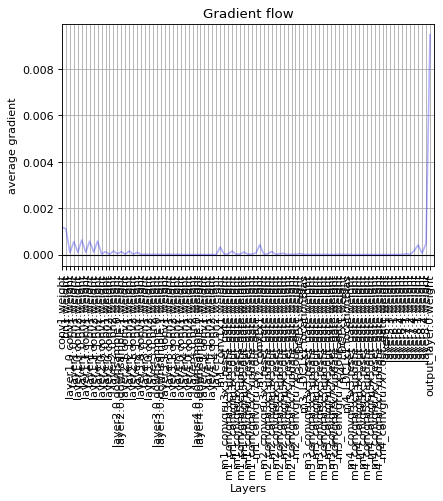

*************************** VAL ***************************
Epoch: 0
VAL :: Epoch 0 Batch 0 | Loss: 0.4666 | L2: 0.6507 | DSSIM: 0.4461
*************************** TESTING ***************************
Epoch: 0
Testing :: Batch 0 | Loss: 0.4022 | L2: 0.4318 | DSSIM: 0.399
--------------------------------------------------------------------------------------
Epoch 1
Train Epoch 1 Batch 0 | Loss: 0.4892 | L2: 0.7132 | DSSIM: 0.4643
Train Epoch 1 Batch 1 | Loss: 0.4084 | L2: 0.3203 | DSSIM: 0.4182
Train Epoch 1 Batch 2 | Loss: 0.4456 | L2: 0.6676 | DSSIM: 0.4209
Train Epoch 1 Batch 3 | Loss: 0.3953 | L2: 0.3786 | DSSIM: 0.3971
Train Epoch 1 Batch 4 | Loss: 0.4483 | L2: 0.4851 | DSSIM: 0.4442
Train Epoch 1 Batch 5 | Loss: 0.4148 | L2: 0.4169 | DSSIM: 0.4145
Train Epoch 1 Batch 6 | Loss: 0.4229 | L2: 0.4546 | DSSIM: 0.4193
Train Epoch 1 Batch 7 | Loss: 0.3896 | L2: 0.3207 | DSSIM: 0.3972
Train Epoch 1 Batch 8 | Loss: 0.364 | L2: 0.3084 | DSSIM: 0.3701
Train Epoch 1 Batch 9 | Loss: 0.3876 | L2

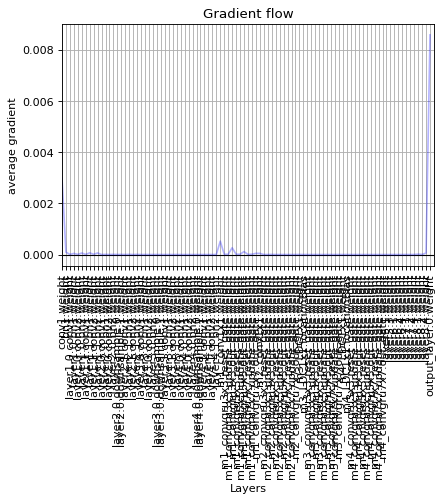

*************************** VAL ***************************
Epoch: 5
VAL :: Epoch 5 Batch 0 | Loss: 0.264 | L2: 0.1714 | DSSIM: 0.2743
*************************** TESTING ***************************
Epoch: 5
Testing :: Batch 0 | Loss: 0.2344 | L2: 0.1406 | DSSIM: 0.2449
--------------------------------------------------------------------------------------
Epoch 6
Train Epoch 6 Batch 0 | Loss: 0.3721 | L2: 0.6976 | DSSIM: 0.336
Train Epoch 6 Batch 1 | Loss: 0.3468 | L2: 0.532 | DSSIM: 0.3262
Train Epoch 6 Batch 2 | Loss: 0.3555 | L2: 0.3524 | DSSIM: 0.3559
Train Epoch 6 Batch 3 | Loss: 0.351 | L2: 0.3818 | DSSIM: 0.3476
Train Epoch 6 Batch 4 | Loss: 0.2192 | L2: 0.1375 | DSSIM: 0.2282
Train Epoch 6 Batch 5 | Loss: 0.2338 | L2: 0.144 | DSSIM: 0.2438
Train Epoch 6 Batch 6 | Loss: 0.2703 | L2: 0.19 | DSSIM: 0.2792
Train Epoch 6 Batch 7 | Loss: 0.248 | L2: 0.1615 | DSSIM: 0.2576
Train Epoch 6 Batch 8 | Loss: 0.3022 | L2: 0.3024 | DSSIM: 0.3022
Train Epoch 6 Batch 9 | Loss: 0.337 | L2: 0.360

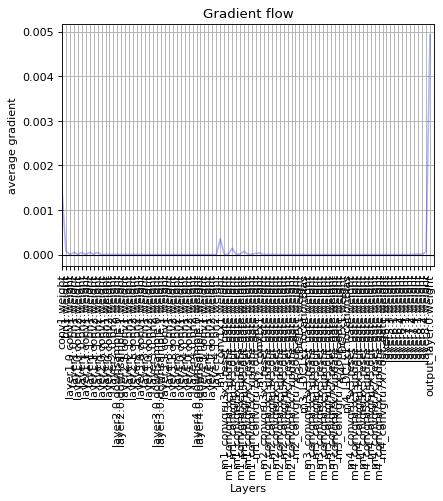

*************************** VAL ***************************
Epoch: 10
VAL :: Epoch 10 Batch 0 | Loss: 0.2196 | L2: 0.1323 | DSSIM: 0.2293
*************************** TESTING ***************************
Epoch: 10
Testing :: Batch 0 | Loss: 0.2156 | L2: 0.1201 | DSSIM: 0.2262
--------------------------------------------------------------------------------------
Epoch 11
Train Epoch 11 Batch 0 | Loss: 0.2458 | L2: 0.1521 | DSSIM: 0.2562
Train Epoch 11 Batch 1 | Loss: 0.2846 | L2: 0.2263 | DSSIM: 0.2911
Train Epoch 11 Batch 2 | Loss: 0.317 | L2: 0.4407 | DSSIM: 0.3033
Train Epoch 11 Batch 3 | Loss: 0.2927 | L2: 0.3477 | DSSIM: 0.2866
Train Epoch 11 Batch 4 | Loss: 0.2566 | L2: 0.2856 | DSSIM: 0.2533
Train Epoch 11 Batch 5 | Loss: 0.3778 | L2: 0.6033 | DSSIM: 0.3527
Train Epoch 11 Batch 6 | Loss: 0.2891 | L2: 0.2368 | DSSIM: 0.2949
Train Epoch 11 Batch 7 | Loss: 0.2254 | L2: 0.1251 | DSSIM: 0.2366
Train Epoch 11 Batch 8 | Loss: 0.2082 | L2: 0.1205 | DSSIM: 0.2179
Train Epoch 11 Batch 9 | Lo

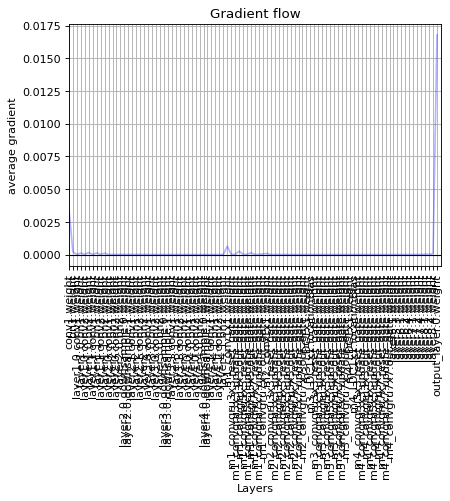

*************************** VAL ***************************
Epoch: 15
VAL :: Epoch 15 Batch 0 | Loss: 0.2209 | L2: 0.1538 | DSSIM: 0.2284
*************************** TESTING ***************************
Epoch: 15
Testing :: Batch 0 | Loss: 0.2032 | L2: 0.1148 | DSSIM: 0.213
--------------------------------------------------------------------------------------
Epoch 16
Train Epoch 16 Batch 0 | Loss: 0.3094 | L2: 0.4066 | DSSIM: 0.2985
Train Epoch 16 Batch 1 | Loss: 0.2924 | L2: 0.4242 | DSSIM: 0.2778
Train Epoch 16 Batch 2 | Loss: 0.2178 | L2: 0.1323 | DSSIM: 0.2273
Train Epoch 16 Batch 3 | Loss: 0.2808 | L2: 0.2789 | DSSIM: 0.281
Train Epoch 16 Batch 4 | Loss: 0.2961 | L2: 0.2289 | DSSIM: 0.3036
Train Epoch 16 Batch 5 | Loss: 0.2171 | L2: 0.1262 | DSSIM: 0.2272
Train Epoch 16 Batch 6 | Loss: 0.3889 | L2: 0.6581 | DSSIM: 0.359
Train Epoch 16 Batch 7 | Loss: 0.3022 | L2: 0.291 | DSSIM: 0.3034
Train Epoch 16 Batch 8 | Loss: 0.2874 | L2: 0.3264 | DSSIM: 0.283
Train Epoch 16 Batch 9 | Loss: 

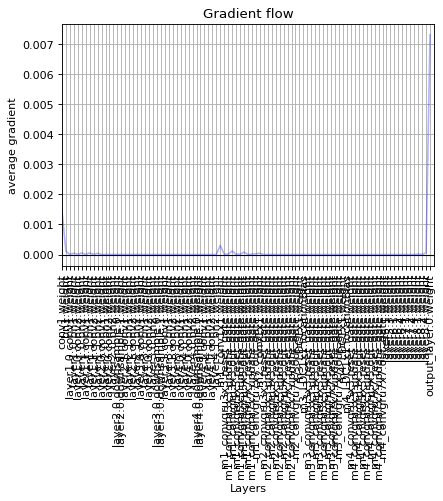

*************************** VAL ***************************
Epoch: 20
VAL :: Epoch 20 Batch 0 | Loss: 0.235 | L2: 0.1527 | DSSIM: 0.2442
*************************** TESTING ***************************
Epoch: 20
Testing :: Batch 0 | Loss: 0.2073 | L2: 0.1172 | DSSIM: 0.2174
--------------------------------------------------------------------------------------
Epoch 21
Train Epoch 21 Batch 0 | Loss: 0.2158 | L2: 0.1089 | DSSIM: 0.2276
Train Epoch 21 Batch 1 | Loss: 0.1982 | L2: 0.1045 | DSSIM: 0.2086
Train Epoch 21 Batch 2 | Loss: 0.3193 | L2: 0.3849 | DSSIM: 0.312
Train Epoch 21 Batch 3 | Loss: 0.3185 | L2: 0.4344 | DSSIM: 0.3056
Train Epoch 21 Batch 4 | Loss: 0.2975 | L2: 0.434 | DSSIM: 0.2823
Train Epoch 21 Batch 5 | Loss: 0.1635 | L2: 0.0655 | DSSIM: 0.1744
Train Epoch 21 Batch 6 | Loss: 0.198 | L2: 0.1065 | DSSIM: 0.2082
Train Epoch 21 Batch 7 | Loss: 0.314 | L2: 0.2977 | DSSIM: 0.3158
Train Epoch 21 Batch 8 | Loss: 0.2863 | L2: 0.3903 | DSSIM: 0.2747
Train Epoch 21 Batch 9 | Loss: 

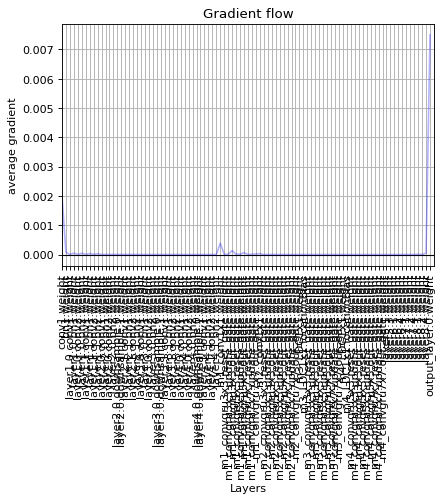

*************************** VAL ***************************
Epoch: 25
VAL :: Epoch 25 Batch 0 | Loss: 0.2668 | L2: 0.1854 | DSSIM: 0.2758
*************************** TESTING ***************************
Epoch: 25
Testing :: Batch 0 | Loss: 0.1827 | L2: 0.1061 | DSSIM: 0.1912
--------------------------------------------------------------------------------------
Epoch 26
Train Epoch 26 Batch 0 | Loss: 0.2904 | L2: 0.3129 | DSSIM: 0.2879
Train Epoch 26 Batch 1 | Loss: 0.3232 | L2: 0.5275 | DSSIM: 0.3005
Train Epoch 26 Batch 2 | Loss: 0.2881 | L2: 0.3225 | DSSIM: 0.2842
Train Epoch 26 Batch 3 | Loss: 0.2182 | L2: 0.1148 | DSSIM: 0.2297
Train Epoch 26 Batch 4 | Loss: 0.2409 | L2: 0.1968 | DSSIM: 0.2459
Train Epoch 26 Batch 5 | Loss: 0.2357 | L2: 0.1345 | DSSIM: 0.2469
Train Epoch 26 Batch 6 | Loss: 0.2309 | L2: 0.1345 | DSSIM: 0.2417
Train Epoch 26 Batch 7 | Loss: 0.2399 | L2: 0.1717 | DSSIM: 0.2475
Train Epoch 26 Batch 8 | Loss: 0.2955 | L2: 0.3644 | DSSIM: 0.2879
Train Epoch 26 Batch 9 | L

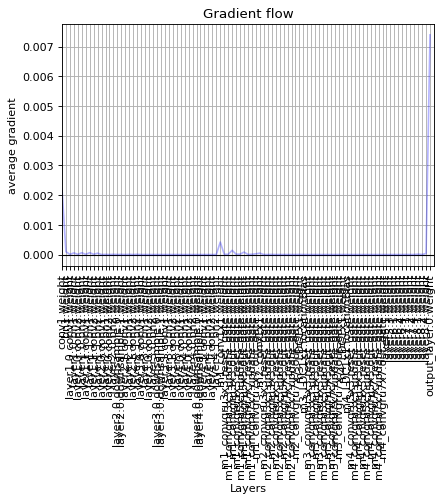

*************************** VAL ***************************
Epoch: 30
VAL :: Epoch 30 Batch 0 | Loss: 0.2224 | L2: 0.1544 | DSSIM: 0.2299
*************************** TESTING ***************************
Epoch: 30
Testing :: Batch 0 | Loss: 0.2099 | L2: 0.122 | DSSIM: 0.2197
--------------------------------------------------------------------------------------
Epoch 31
Train Epoch 31 Batch 0 | Loss: 0.2727 | L2: 0.2449 | DSSIM: 0.2758
Train Epoch 31 Batch 1 | Loss: 0.3457 | L2: 0.4249 | DSSIM: 0.3369
Train Epoch 31 Batch 2 | Loss: 0.2937 | L2: 0.3132 | DSSIM: 0.2915
Train Epoch 31 Batch 3 | Loss: 0.2339 | L2: 0.1767 | DSSIM: 0.2402
Train Epoch 31 Batch 4 | Loss: 0.2436 | L2: 0.2608 | DSSIM: 0.2417
Train Epoch 31 Batch 5 | Loss: 0.2662 | L2: 0.3632 | DSSIM: 0.2554
Train Epoch 31 Batch 6 | Loss: 0.2142 | L2: 0.1144 | DSSIM: 0.2253
Train Epoch 31 Batch 7 | Loss: 0.3485 | L2: 0.37 | DSSIM: 0.3461
Train Epoch 31 Batch 8 | Loss: 0.279 | L2: 0.2186 | DSSIM: 0.2857
Train Epoch 31 Batch 9 | Loss:

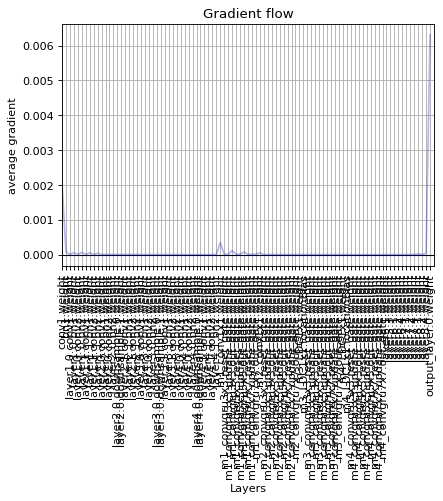

*************************** VAL ***************************
Epoch: 35
VAL :: Epoch 35 Batch 0 | Loss: 0.2327 | L2: 0.1585 | DSSIM: 0.2409
*************************** TESTING ***************************
Epoch: 35
Testing :: Batch 0 | Loss: 0.2093 | L2: 0.1175 | DSSIM: 0.2195
--------------------------------------------------------------------------------------
Epoch 36
Train Epoch 36 Batch 0 | Loss: 0.2535 | L2: 0.1869 | DSSIM: 0.261
Train Epoch 36 Batch 1 | Loss: 0.3028 | L2: 0.4029 | DSSIM: 0.2917
Train Epoch 36 Batch 2 | Loss: 0.2597 | L2: 0.1574 | DSSIM: 0.2711
Train Epoch 36 Batch 3 | Loss: 0.3075 | L2: 0.3051 | DSSIM: 0.3078
Train Epoch 36 Batch 4 | Loss: 0.2046 | L2: 0.1319 | DSSIM: 0.2127
Train Epoch 36 Batch 5 | Loss: 0.3654 | L2: 0.5975 | DSSIM: 0.3396
Train Epoch 36 Batch 6 | Loss: 0.2292 | L2: 0.2257 | DSSIM: 0.2296
Train Epoch 36 Batch 7 | Loss: 0.2116 | L2: 0.1486 | DSSIM: 0.2186
Train Epoch 36 Batch 8 | Loss: 0.2495 | L2: 0.2184 | DSSIM: 0.2529
Train Epoch 36 Batch 9 | Lo

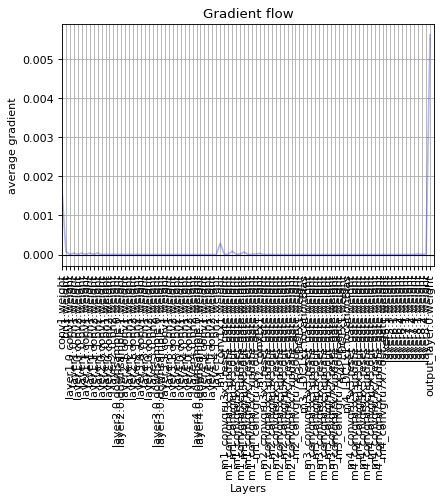

*************************** VAL ***************************
Epoch: 40
VAL :: Epoch 40 Batch 0 | Loss: 0.1991 | L2: 0.1295 | DSSIM: 0.2069
*************************** TESTING ***************************
Epoch: 40
Testing :: Batch 0 | Loss: 0.1916 | L2: 0.1013 | DSSIM: 0.2016
--------------------------------------------------------------------------------------
Epoch 41
Train Epoch 41 Batch 0 | Loss: 0.2865 | L2: 0.2288 | DSSIM: 0.293
Train Epoch 41 Batch 1 | Loss: 0.2066 | L2: 0.1214 | DSSIM: 0.216
Train Epoch 41 Batch 2 | Loss: 0.2208 | L2: 0.1289 | DSSIM: 0.2311
Train Epoch 41 Batch 3 | Loss: 0.1994 | L2: 0.1032 | DSSIM: 0.2101
Train Epoch 41 Batch 4 | Loss: 0.1895 | L2: 0.1003 | DSSIM: 0.1994
Train Epoch 41 Batch 5 | Loss: 0.3436 | L2: 0.3569 | DSSIM: 0.3421
Train Epoch 41 Batch 6 | Loss: 0.2758 | L2: 0.2165 | DSSIM: 0.2824
Train Epoch 41 Batch 7 | Loss: 0.2573 | L2: 0.2943 | DSSIM: 0.2532
Train Epoch 41 Batch 8 | Loss: 0.192 | L2: 0.1432 | DSSIM: 0.1974
Train Epoch 41 Batch 9 | Loss

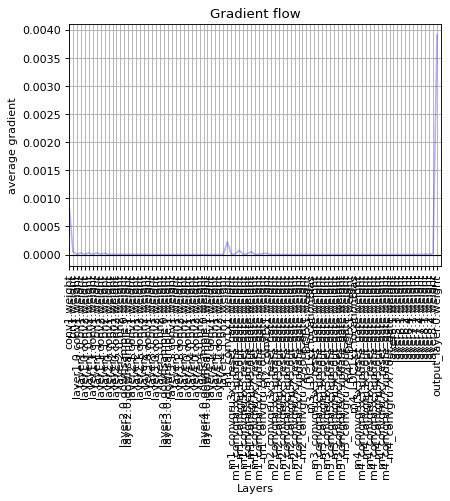

*************************** VAL ***************************
Epoch: 45
VAL :: Epoch 45 Batch 0 | Loss: 0.2151 | L2: 0.1299 | DSSIM: 0.2246
*************************** TESTING ***************************
Epoch: 45
Testing :: Batch 0 | Loss: 0.233 | L2: 0.1469 | DSSIM: 0.2425
--------------------------------------------------------------------------------------
Epoch 46
Train Epoch 46 Batch 0 | Loss: 0.1969 | L2: 0.1171 | DSSIM: 0.2057
Train Epoch 46 Batch 1 | Loss: 0.2962 | L2: 0.3252 | DSSIM: 0.293
Train Epoch 46 Batch 2 | Loss: 0.253 | L2: 0.167 | DSSIM: 0.2625
Train Epoch 46 Batch 3 | Loss: 0.2016 | L2: 0.1071 | DSSIM: 0.2121
Train Epoch 46 Batch 4 | Loss: 0.3333 | L2: 0.3515 | DSSIM: 0.3313
Train Epoch 46 Batch 5 | Loss: 0.2906 | L2: 0.2835 | DSSIM: 0.2914
Train Epoch 46 Batch 6 | Loss: 0.3208 | L2: 0.3181 | DSSIM: 0.3211
Train Epoch 46 Batch 7 | Loss: 0.1872 | L2: 0.0868 | DSSIM: 0.1984
Train Epoch 46 Batch 8 | Loss: 0.2697 | L2: 0.3436 | DSSIM: 0.2614
Train Epoch 46 Batch 9 | Loss:

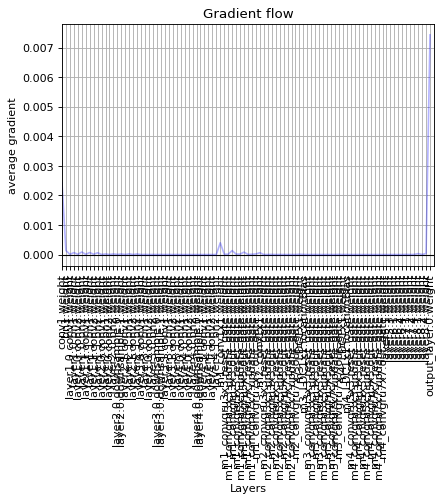

*************************** VAL ***************************
Epoch: 50
VAL :: Epoch 50 Batch 0 | Loss: 0.2416 | L2: 0.1479 | DSSIM: 0.252
*************************** TESTING ***************************
Epoch: 50
Testing :: Batch 0 | Loss: 0.2106 | L2: 0.1113 | DSSIM: 0.2216
--------------------------------------------------------------------------------------
Epoch 51
Train Epoch 51 Batch 0 | Loss: 0.3606 | L2: 0.5008 | DSSIM: 0.345
Train Epoch 51 Batch 1 | Loss: 0.2387 | L2: 0.197 | DSSIM: 0.2433
Train Epoch 51 Batch 2 | Loss: 0.1902 | L2: 0.1204 | DSSIM: 0.1979
Train Epoch 51 Batch 3 | Loss: 0.2107 | L2: 0.1597 | DSSIM: 0.2163
Train Epoch 51 Batch 4 | Loss: 0.3001 | L2: 0.2341 | DSSIM: 0.3074
Train Epoch 51 Batch 5 | Loss: 0.2082 | L2: 0.1093 | DSSIM: 0.2192
Train Epoch 51 Batch 6 | Loss: 0.2223 | L2: 0.1407 | DSSIM: 0.2314
Train Epoch 51 Batch 7 | Loss: 0.2706 | L2: 0.2227 | DSSIM: 0.2759
Train Epoch 51 Batch 8 | Loss: 0.3009 | L2: 0.3391 | DSSIM: 0.2967
Train Epoch 51 Batch 9 | Loss

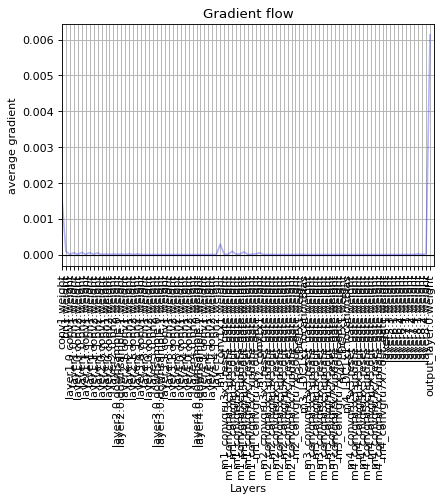

*************************** VAL ***************************
Epoch: 55
VAL :: Epoch 55 Batch 0 | Loss: 0.2669 | L2: 0.3173 | DSSIM: 0.2614
*************************** TESTING ***************************
Epoch: 55
Testing :: Batch 0 | Loss: 0.1811 | L2: 0.0965 | DSSIM: 0.1905
--------------------------------------------------------------------------------------
Epoch 56
Train Epoch 56 Batch 0 | Loss: 0.2815 | L2: 0.3005 | DSSIM: 0.2794
Train Epoch 56 Batch 1 | Loss: 0.3353 | L2: 0.3273 | DSSIM: 0.3362
Train Epoch 56 Batch 2 | Loss: 0.2647 | L2: 0.1908 | DSSIM: 0.2729
Train Epoch 56 Batch 3 | Loss: 0.2586 | L2: 0.1736 | DSSIM: 0.2681
Train Epoch 56 Batch 4 | Loss: 0.3104 | L2: 0.2977 | DSSIM: 0.3118
Train Epoch 56 Batch 5 | Loss: 0.2127 | L2: 0.1235 | DSSIM: 0.2226
Train Epoch 56 Batch 6 | Loss: 0.1978 | L2: 0.1197 | DSSIM: 0.2065
Train Epoch 56 Batch 7 | Loss: 0.1794 | L2: 0.0949 | DSSIM: 0.1887
Train Epoch 56 Batch 8 | Loss: 0.2812 | L2: 0.2601 | DSSIM: 0.2835
Train Epoch 56 Batch 9 | L

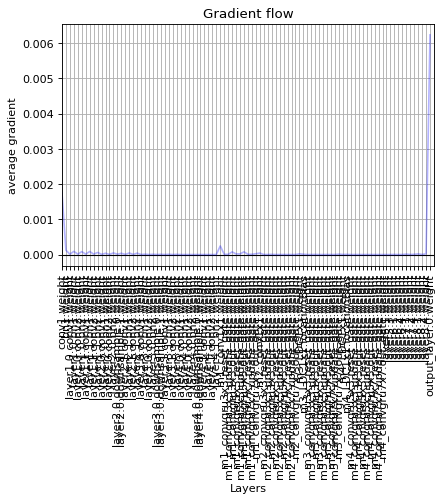

*************************** VAL ***************************
Epoch: 60
VAL :: Epoch 60 Batch 0 | Loss: 0.2513 | L2: 0.2869 | DSSIM: 0.2474
*************************** TESTING ***************************
Epoch: 60
Testing :: Batch 0 | Loss: 0.2058 | L2: 0.1097 | DSSIM: 0.2165
--------------------------------------------------------------------------------------
Epoch 61
Train Epoch 61 Batch 0 | Loss: 0.2658 | L2: 0.1903 | DSSIM: 0.2742
Train Epoch 61 Batch 1 | Loss: 0.2735 | L2: 0.2604 | DSSIM: 0.2749
Train Epoch 61 Batch 2 | Loss: 0.3171 | L2: 0.3599 | DSSIM: 0.3123
Train Epoch 61 Batch 3 | Loss: 0.2575 | L2: 0.2066 | DSSIM: 0.2632
Train Epoch 61 Batch 4 | Loss: 0.3128 | L2: 0.398 | DSSIM: 0.3033
Train Epoch 61 Batch 5 | Loss: 0.3149 | L2: 0.3422 | DSSIM: 0.3119
Train Epoch 61 Batch 6 | Loss: 0.2343 | L2: 0.1576 | DSSIM: 0.2429
Train Epoch 61 Batch 7 | Loss: 0.266 | L2: 0.2484 | DSSIM: 0.2679
Train Epoch 61 Batch 8 | Loss: 0.1945 | L2: 0.0914 | DSSIM: 0.2059
Train Epoch 61 Batch 9 | Los

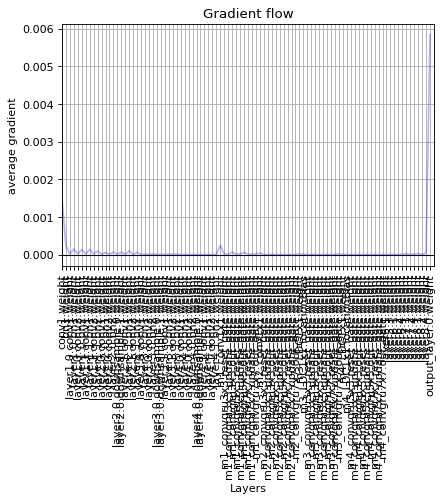

*************************** VAL ***************************
Epoch: 65
VAL :: Epoch 65 Batch 0 | Loss: 0.2333 | L2: 0.1437 | DSSIM: 0.2432
*************************** TESTING ***************************
Epoch: 65
Testing :: Batch 0 | Loss: 0.1822 | L2: 0.0991 | DSSIM: 0.1915
--------------------------------------------------------------------------------------
Epoch 66
Train Epoch 66 Batch 0 | Loss: 0.2518 | L2: 0.2702 | DSSIM: 0.2498
Train Epoch 66 Batch 1 | Loss: 0.2193 | L2: 0.1141 | DSSIM: 0.231
Train Epoch 66 Batch 2 | Loss: 0.2711 | L2: 0.2263 | DSSIM: 0.2761
Train Epoch 66 Batch 3 | Loss: 0.2136 | L2: 0.1257 | DSSIM: 0.2234
Train Epoch 66 Batch 4 | Loss: 0.2644 | L2: 0.216 | DSSIM: 0.2698
Train Epoch 66 Batch 5 | Loss: 0.2276 | L2: 0.1475 | DSSIM: 0.2365
Train Epoch 66 Batch 6 | Loss: 0.2292 | L2: 0.1322 | DSSIM: 0.24
Train Epoch 66 Batch 7 | Loss: 0.2928 | L2: 0.2081 | DSSIM: 0.3022
Train Epoch 66 Batch 8 | Loss: 0.1863 | L2: 0.0942 | DSSIM: 0.1965
Train Epoch 66 Batch 9 | Loss:

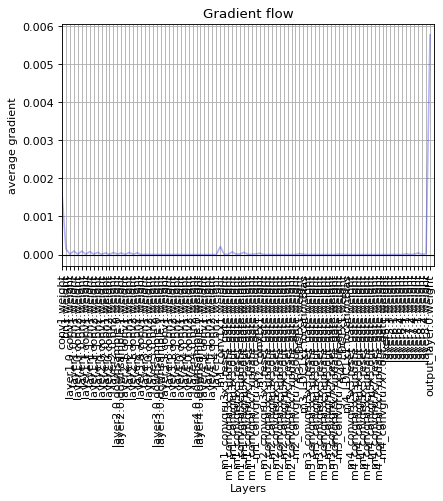

*************************** VAL ***************************
Epoch: 70
VAL :: Epoch 70 Batch 0 | Loss: 0.2018 | L2: 0.1468 | DSSIM: 0.2079
*************************** TESTING ***************************
Epoch: 70
Testing :: Batch 0 | Loss: 0.2308 | L2: 0.151 | DSSIM: 0.2397
--------------------------------------------------------------------------------------
Epoch 71
Train Epoch 71 Batch 0 | Loss: 0.2197 | L2: 0.1233 | DSSIM: 0.2304
Train Epoch 71 Batch 1 | Loss: 0.3636 | L2: 0.5446 | DSSIM: 0.3435
Train Epoch 71 Batch 2 | Loss: 0.3047 | L2: 0.2376 | DSSIM: 0.3122
Train Epoch 71 Batch 3 | Loss: 0.2579 | L2: 0.258 | DSSIM: 0.2579
Train Epoch 71 Batch 4 | Loss: 0.2241 | L2: 0.1226 | DSSIM: 0.2353
Train Epoch 71 Batch 5 | Loss: 0.2919 | L2: 0.2345 | DSSIM: 0.2983
Train Epoch 71 Batch 6 | Loss: 0.251 | L2: 0.165 | DSSIM: 0.2605
Train Epoch 71 Batch 7 | Loss: 0.2566 | L2: 0.1575 | DSSIM: 0.2676
Train Epoch 71 Batch 8 | Loss: 0.26 | L2: 0.188 | DSSIM: 0.268
Train Epoch 71 Batch 9 | Loss: 0.1

In [ ]:
for n in range(no_of_epochs):
  model.train()
  print("--------------------------------------------------------------------------------------")
  print("Epoch",n)

  Loss_History = []; L2_History = []; DSSIM_History = []
  
  for batch_idx, frames in enumerate(train_loader, 0):
    Loss = torch.zeros(size = (1,1)).to(device) # Reset Accumulated Loss
    Pred = []
    GT = []

    optimizer.zero_grad()
    
    ################################################################################################################################################################################################################
    # MAIN TRAINING LOOP

    # Iterate over GT0, GT1, GT2 
    for i in range(0,3):
      first_frame = False
      if (i == 0):
        hidden = []
        first_frame = True

      output, hidden = model( frames[1][:,i,:,:,:].reshape(-1,3,height,width).float().to(device) , hidden, first_frame = first_frame)
     
    # Append Pred0 and GT3( Output obtained after first 3 input frames to a list)
    Pred.append( output )
    GT.append( frames[2][:,0,:,:,:].reshape(-1,3,height,width).float().to(device) )
      
    # Now run two more times to obtain Pred1 and Pred2 (Also collect GT_1 and GT_2)
    for j in range(1,3):  
      first_frame = False
      output, hidden = model( output , hidden, first_frame = first_frame)

      Pred.append(output)
      GT.append(frames[2][:,j,:,:,:].reshape(-1,3,height,width).float().to(device))
    ################################################################################################################################################################################################################

    Pred = torch.cat(Pred, dim = 0)
    GT = torch.cat(GT, dim = 0)

    L2_loss = l2_loss(Pred, GT)
    DSSIM_loss = ssim_loss(Pred, GT, window_size = ssim_window )

    Loss = (1-alpha)*L2_loss + alpha*DSSIM_loss

    Loss.backward()

    #Gradient Clipping
    nn.utils.clip_grad_value_(model.parameters(), clip_value = 1.0)

    optimizer.step()

    Loss_History.append(Loss.item())
    L2_History.append(L2_loss.item())
    DSSIM_History.append(DSSIM_loss.item())

    if batch_idx%1 == 0:
      print("Train Epoch",n,"Batch",batch_idx,"| Loss:",np.round(Loss.item(),4),"| L2:",np.round(L2_loss.item(),4),"| DSSIM:",np.round(DSSIM_loss.item(),4))  

  
  Epoch_Loss.append(sum(Loss_History)/len(Loss_History))
  Epoch_L2.append(sum(L2_History)/len(L2_History))
  Epoch_DSSIM.append(sum(DSSIM_History)/len(DSSIM_History))

  Train_imgs = [frames, Pred]

  if n%5 == 0:  
    plot_grad_flow(model.named_parameters())


  Val_loss, Val_L2, Val_DSSIM, Val_imgs = validation( n, val_loader, model, device, alpha, ssim_window)
      
  Val_Epoch_Loss.append(Val_loss)
  Val_Epoch_L2.append(Val_L2)
  Val_Epoch_DSSIM.append(Val_DSSIM)

  Test_loss, Test_L2, Test_DSSIM, Test_imgs = testing( n, test_loader, model, device, alpha, ssim_window) 

  Test_Epoch_Loss.append(Test_loss)
  Test_Epoch_L2.append(Test_L2)
  Test_Epoch_DSSIM.append(Test_DSSIM)


# Plot Losses 

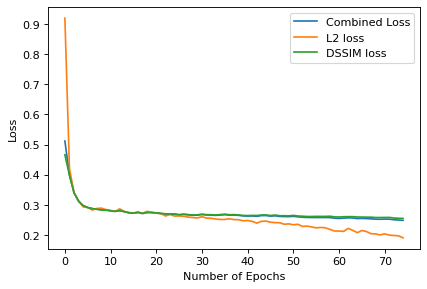

In [ ]:
plt.plot(Epoch_Loss, label = 'Combined Loss')
plt.plot(Epoch_L2, label = 'L2 loss')
plt.plot(Epoch_DSSIM, label = 'DSSIM loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.legend()

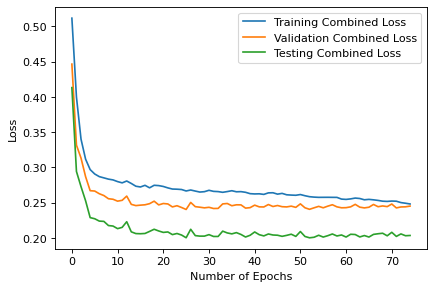

In [ ]:
plt.plot(Epoch_Loss, label = 'Training Combined Loss')
plt.plot(Val_Epoch_Loss, label = 'Validation Combined Loss')
plt.plot(Test_Epoch_Loss, label = 'Testing Combined Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.legend()

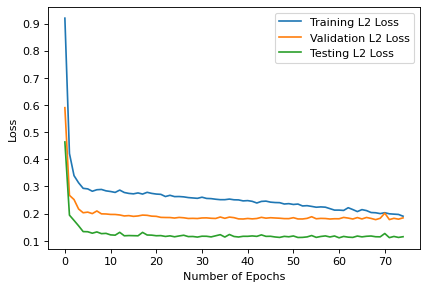

In [ ]:
plt.plot(Epoch_L2, label = 'Training L2 Loss')
plt.plot(Val_Epoch_L2, label = 'Validation L2 Loss')
plt.plot(Test_Epoch_L2, label = 'Testing L2 Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.legend()

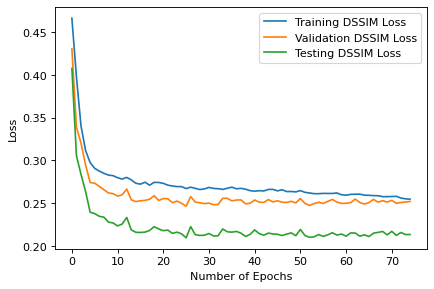

In [ ]:
plt.plot(Epoch_DSSIM, label = 'Training DSSIM Loss')
plt.plot(Val_Epoch_DSSIM, label = 'Validation DSSIM Loss')
plt.plot(Test_Epoch_DSSIM, label = 'Testing DSSIM Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.legend()

# Save Model

In [ ]:
torch.save(model,'/content/gdrive/MyDrive/CUDA/Model_MMNIST/PR/mmnist_rohilpr_differentlr_4000instances.pkl')

# Plot images

## Train

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


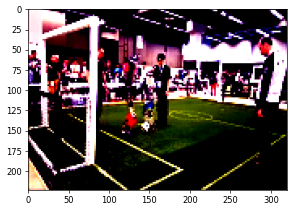

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


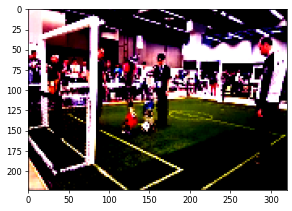

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


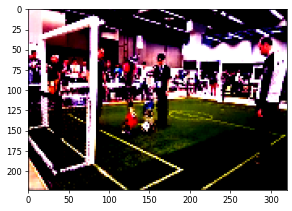

In [ ]:
i = 0
# Instance number 
b = 5
#Batch Size
plt.imshow(Train_imgs[1][i].detach().cpu().numpy().transpose((1,2,0))) 
plt.pause(1) 
plt.imshow(Train_imgs[1][i+b].detach().cpu().numpy().transpose((1,2,0))) 
plt.pause(1)
plt.imshow(Train_imgs[1][i+2*b].detach().cpu().numpy().transpose((1,2,0)))
plt.pause(1) 

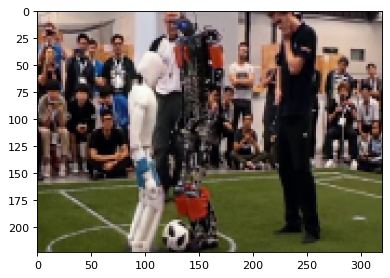

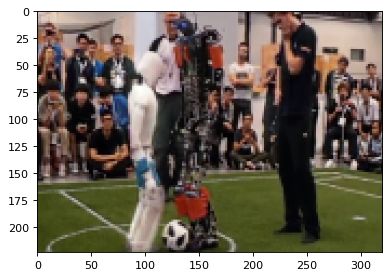

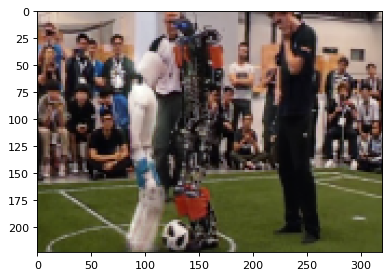

In [ ]:
i = 1
# Instance number 
b = 5
#Batch Size
plt.imshow(torch.clamp(Invert_Norm(Train_imgs[1][i], train_dataset.mean, train_dataset.std), 0 ,1).detach().cpu().numpy().transpose((1,2,0))) 
plt.pause(1) 
plt.imshow(torch.clamp(Invert_Norm(Train_imgs[1][i + b], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0))) 
plt.pause(1)
plt.imshow(torch.clamp(Invert_Norm(Train_imgs[1][i + 2*b], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0)))
plt.pause(1) 

In [ ]:
import matplotlib 
matplotlib.rcParams['figure.dpi'] = 80

EXAMPLE  0


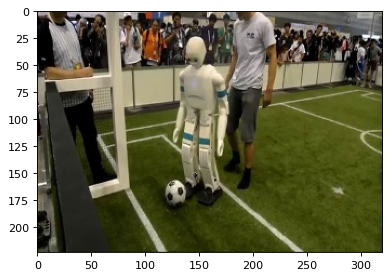

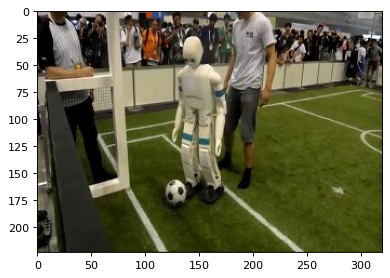

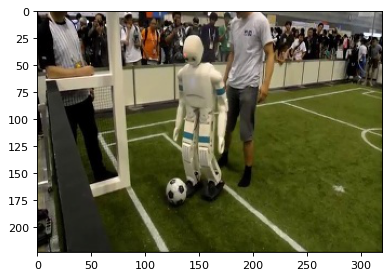

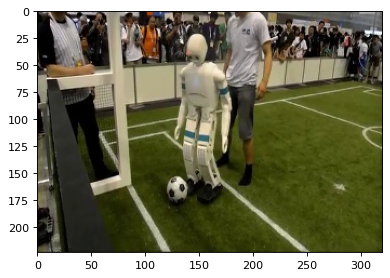

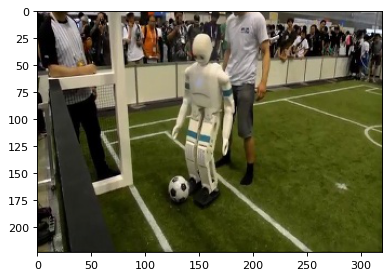

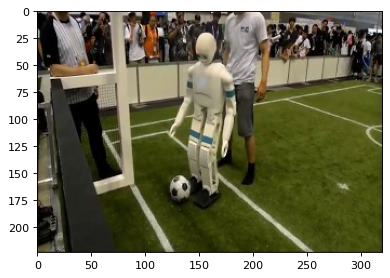

EXAMPLE  1


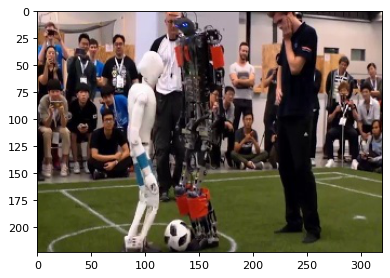

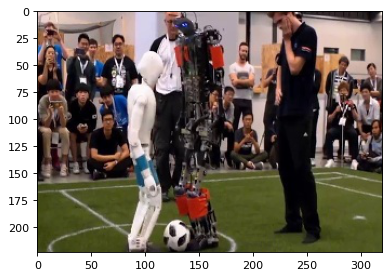

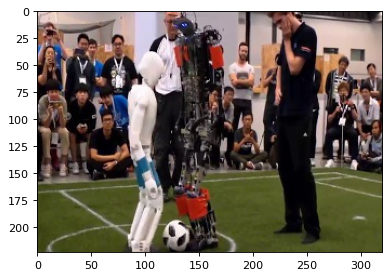

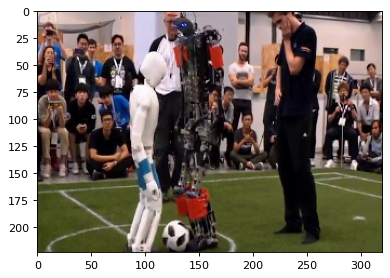

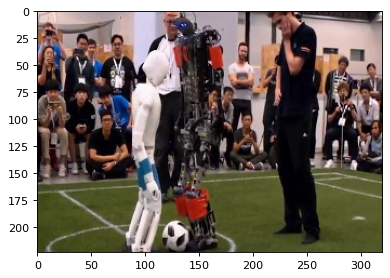

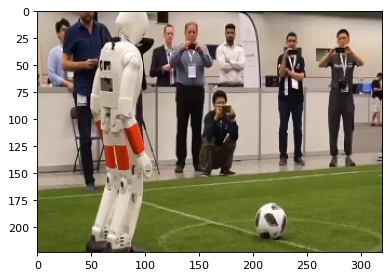

EXAMPLE  2


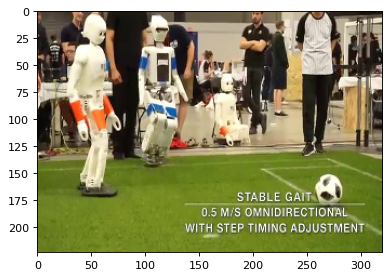

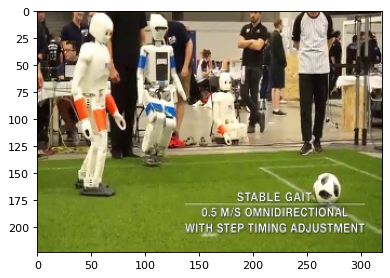

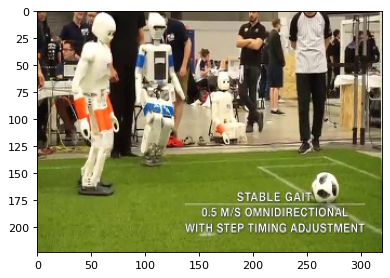

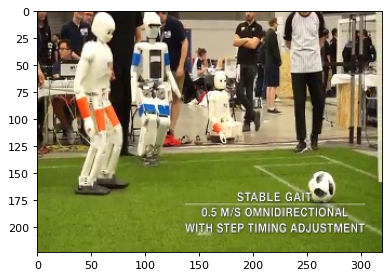

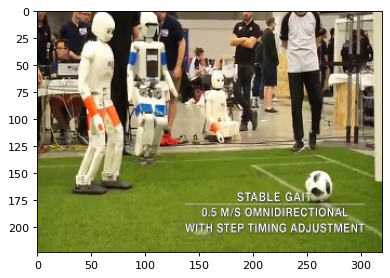

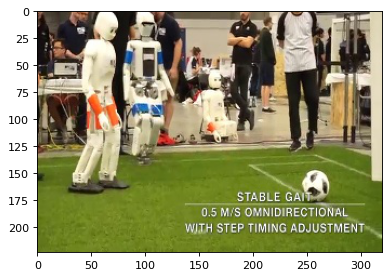

EXAMPLE  3


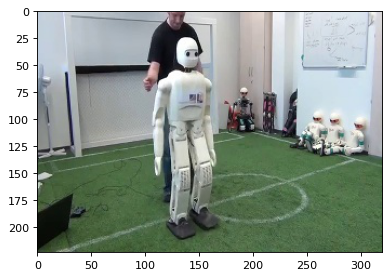

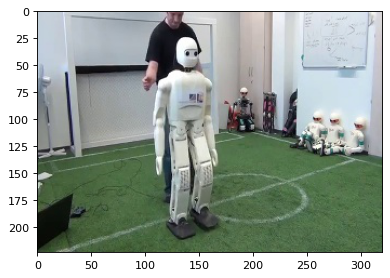

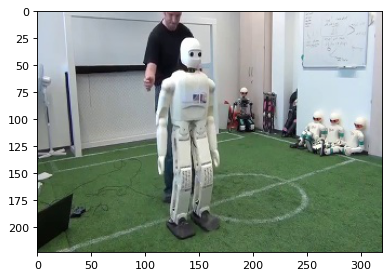

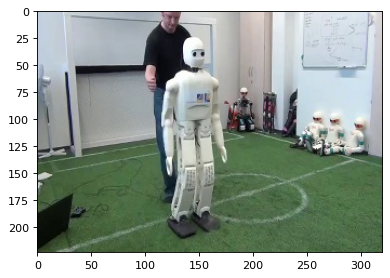

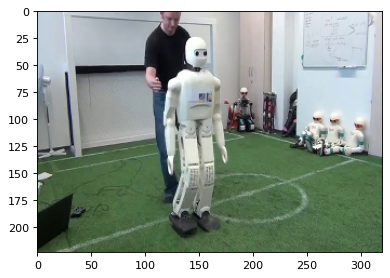

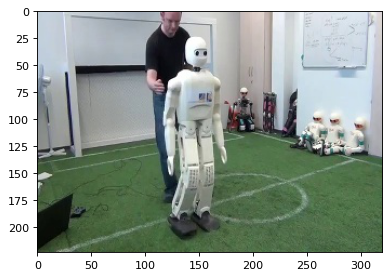

EXAMPLE  4


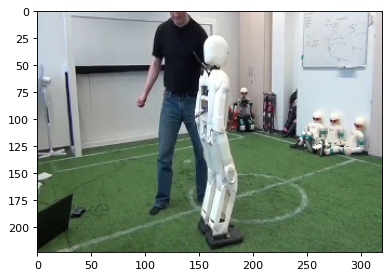

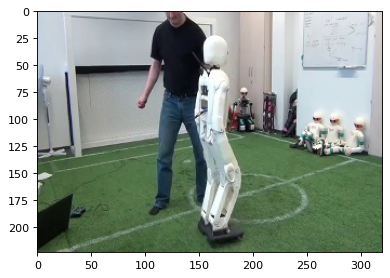

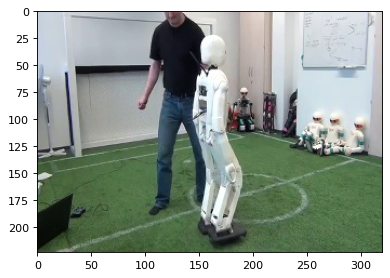

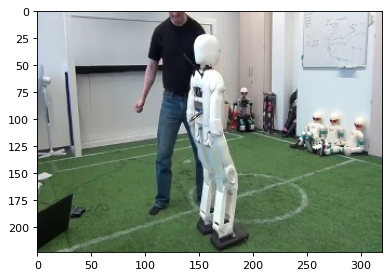

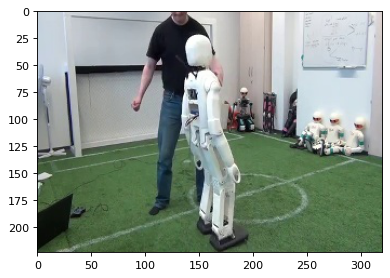

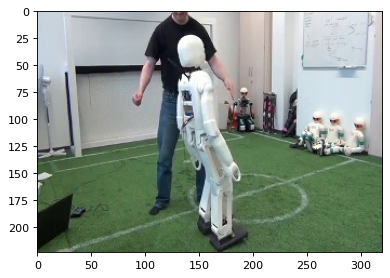

In [ ]:
i = 4
# Instance number 
b = 5
#Batch Size
for i in range(5):
  print("EXAMPLE ",i)
  plt.imshow(torch.clamp(Invert_Norm(Train_imgs[0][1][i][0], train_dataset.mean, train_dataset.std), 0 ,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.pause(0.1) 
  plt.imshow(torch.clamp(Invert_Norm(Train_imgs[0][1][i][1], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.pause(0.1)
  plt.imshow(torch.clamp(Invert_Norm(Train_imgs[0][1][i][2], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0)))
  plt.pause(0.1) 
  plt.imshow(torch.clamp(Invert_Norm(Train_imgs[0][2][i][0], train_dataset.mean, train_dataset.std), 0 ,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.pause(0.1) 
  plt.imshow(torch.clamp(Invert_Norm(Train_imgs[0][2][i][1], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.pause(0.1)
  plt.imshow(torch.clamp(Invert_Norm(Train_imgs[0][2][i][2], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0)))
  plt.pause(0.1) 

## Val

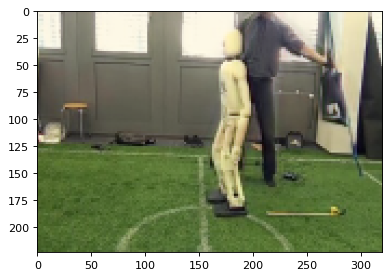

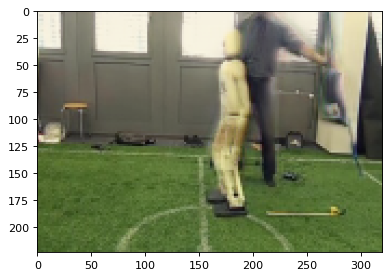

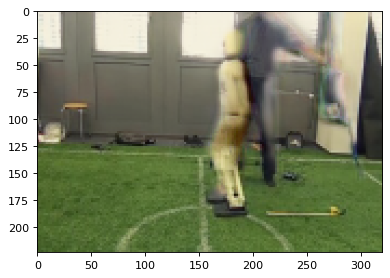

In [ ]:
i = 0
# Instance number 
b = 5
#Batch Size
plt.imshow(torch.clamp(Invert_Norm(Val_imgs[1][i], train_dataset.mean, train_dataset.std), 0 ,1).detach().cpu().numpy().transpose((1,2,0))) 
plt.pause(1) 
plt.imshow(torch.clamp(Invert_Norm(Val_imgs[1][i + b ], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0))) 
plt.pause(1)
plt.imshow(torch.clamp(Invert_Norm(Val_imgs[1][i + 2*b], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0)))
plt.pause(1) 

## Test

In [ ]:
path = '/content/gdrive/MyDrive/CUDA/Output Images/Robot Data/Pred/'
version = 0

***** 0


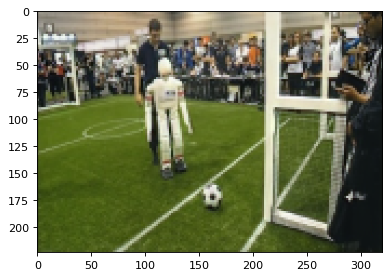

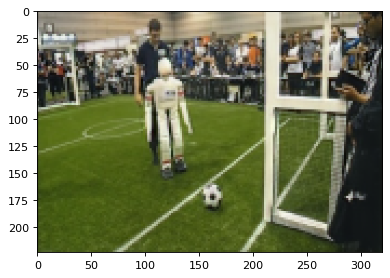

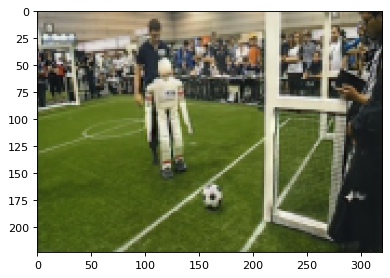

***** 1


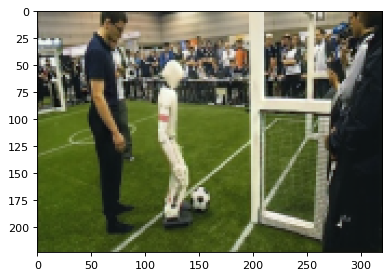

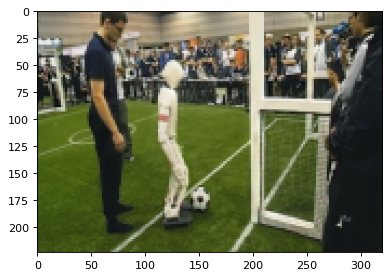

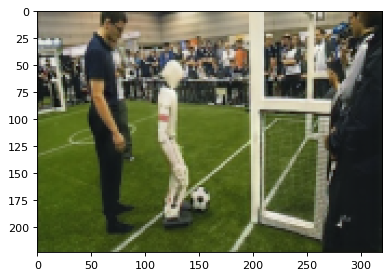

***** 2


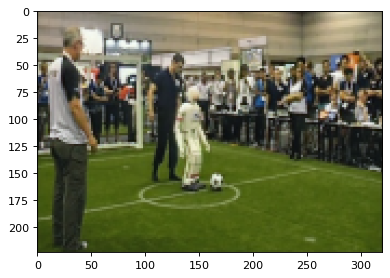

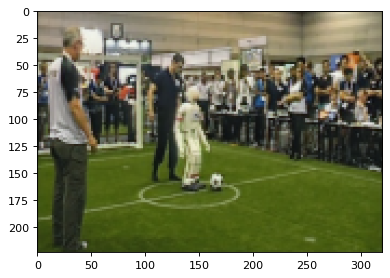

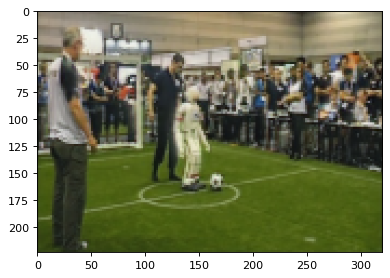

***** 3


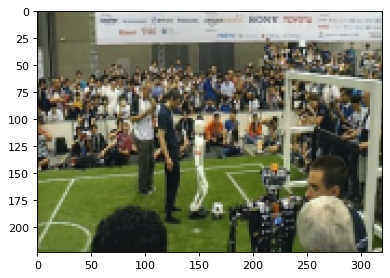

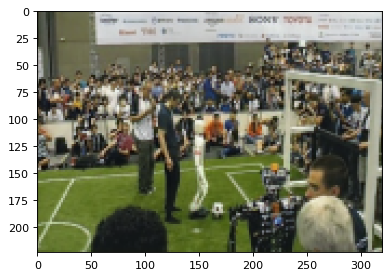

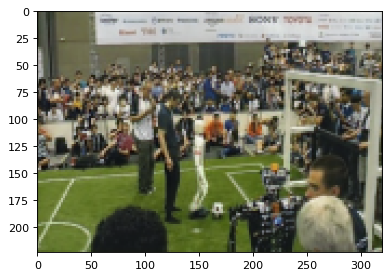

***** 4


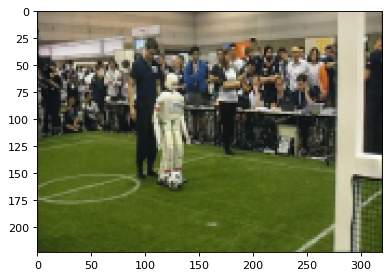

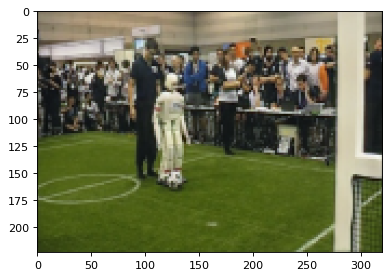

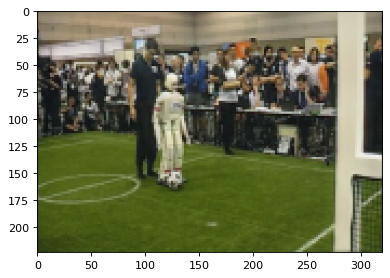

In [ ]:
i = 1
counter = 0
# Instance number 
b = 5
#Batch Size
for i in range(5):
  print("*****", i)
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[1][i], train_dataset.mean, train_dataset.std), 0 ,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.savefig(path+'Version'+str(version)+'Test_Pred'+str(counter)+'.png')
  plt.pause(0.1)

  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[1][i + b ], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.savefig(path+'Version'+str(version)+'Test_Pred'+str(counter+1)+'.png')
  plt.pause(1)
  
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[1][i + 2*b], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0)))
  plt.savefig(path+'Version'+str(version)+'Test_Pred'+str(counter+2)+'.png')
  plt.pause(1) 
  
  counter = counter + 3

In [ ]:
path = '/content/gdrive/MyDrive/CUDA/Output Images/Robot Data/GT/'
version = 0

***** 0


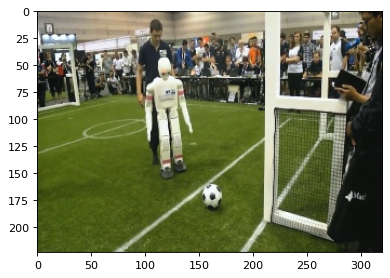

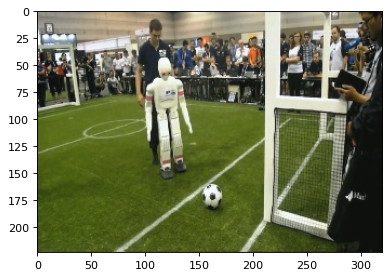

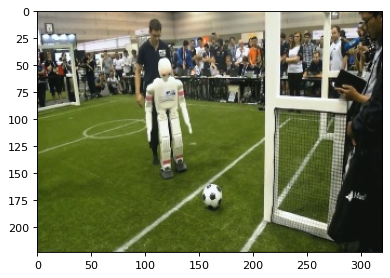

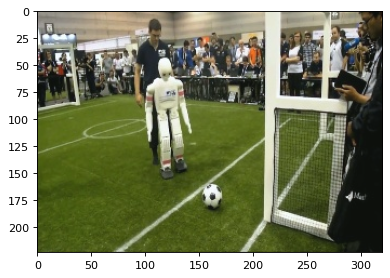

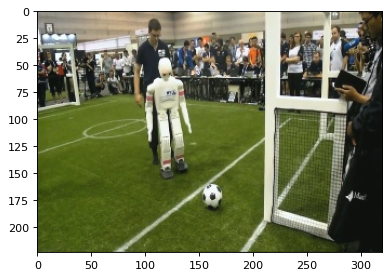

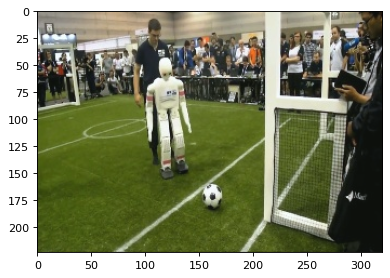

***** 1


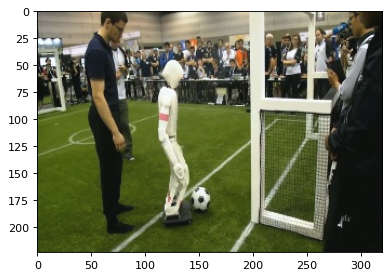

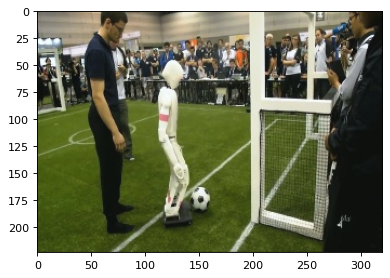

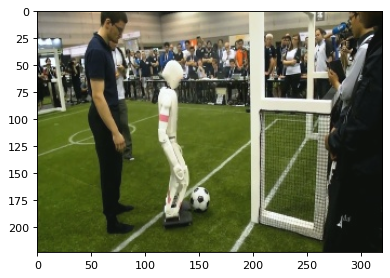

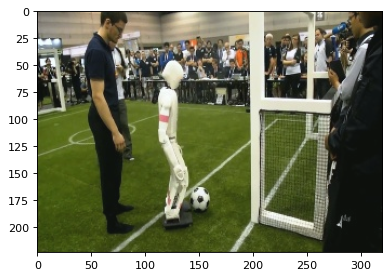

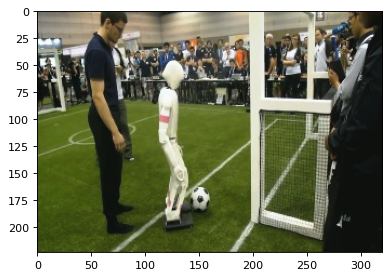

In [ ]:
i = 1
# Instance number 
b = 5
#Batch Size
counter = 0
for i in range(5):
  print("*****", i)
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[0][1][i][0], train_dataset.mean, train_dataset.std), 0 ,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.savefig(path+'Version'+str(version)+'Test_GT'+str(counter)+'.png')
  plt.pause(1) 
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[0][1][i][1], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.savefig(path+'Version'+str(version)+'Test_GT'+str(counter+1)+'.png')
  plt.pause(1)
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[0][1][i][2], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0)))
  plt.savefig(path+'Version'+str(version)+'Test_GT'+str(counter+2)+'.png')
  plt.pause(1) 
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[0][2][i][0], train_dataset.mean, train_dataset.std), 0 ,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.savefig(path+'Version'+str(version)+'Test_GT'+str(counter+3)+'.png') 
  plt.pause(1) 
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[0][2][i][1], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0))) 
  plt.savefig(path+'Version'+str(version)+'Test_GT'+str(counter+4)+'.png')
  plt.pause(1)
  plt.imshow(torch.clamp(Invert_Norm(Test_imgs[0][2][i][2], train_dataset.mean, train_dataset.std),0,1).detach().cpu().numpy().transpose((1,2,0)))
  plt.savefig(path+'Version'+str(version)+'Test_GT'+str(counter+5)+'.png')
  plt.pause(1) 
  counter = counter + 6

# Plotting GIF

## Training

In [ ]:
i = 4 # Instance number
b = 5 # Batch number
seq_gt = torch.stack([Invert_Norm(Train_imgs[0][1][i][0], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Train_imgs[0][1][i][1], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Train_imgs[0][1][i][2], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                   Invert_Norm(Train_imgs[0][2][i][0], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Train_imgs[0][2][i][1], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Train_imgs[0][2][i][2], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu() ])


seq_pred = torch.stack([Invert_Norm(Train_imgs[0][1][i][0], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Train_imgs[0][1][i][1], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Train_imgs[0][1][i][2], train_dataset.mean, train_dataset.std).permute(1,2,0).detach().cpu(),
                  torch.clamp(Invert_Norm(Train_imgs[1][i], train_dataset.mean, train_dataset.std), 0 ,1).permute(1,2,0).detach().cpu(),
                    torch.clamp(Invert_Norm(Train_imgs[1][i + b], train_dataset.mean, train_dataset.std), 0 ,1).permute(1,2,0).detach().cpu(),
                    torch.clamp(Invert_Norm(Train_imgs[1][i + 2*b], train_dataset.mean, train_dataset.std), 0 ,1).permute(1,2,0).detach().cpu()])

In [ ]:
write_apng('./Train_GT'+str(i)+'.gif', (seq_gt*255).int().numpy().astype(np.uint8), delay = 300)

write_apng('./Train_Pred'+str(i)+'.gif', (seq_pred*255).int().numpy().astype(np.uint8), delay = 300)

## Testing

In [ ]:
i = 4 # Instance number
b = 5 # Batch number
seq_gt = torch.stack([Invert_Norm(Test_imgs[0][1][i][0], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Test_imgs[0][1][i][1], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Test_imgs[0][1][i][2], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                   Invert_Norm(Test_imgs[0][2][i][0], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Test_imgs[0][2][i][1], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Test_imgs[0][2][i][2], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu() ])


seq_pred = torch.stack([Invert_Norm(Test_imgs[0][1][i][0], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Test_imgs[0][1][i][1], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                  Invert_Norm(Test_imgs[0][1][i][2], test_dataset.mean, test_dataset.std).permute(1,2,0).detach().cpu(),
                  torch.clamp(Invert_Norm(Test_imgs[1][i], test_dataset.mean, test_dataset.std), 0 ,1).permute(1,2,0).detach().cpu(),
                    torch.clamp(Invert_Norm(Test_imgs[1][i + b], test_dataset.mean, test_dataset.std), 0 ,1).permute(1,2,0).detach().cpu(),
                    torch.clamp(Invert_Norm(Test_imgs[1][i + 2*b], test_dataset.mean, test_dataset.std), 0 ,1).permute(1,2,0).detach().cpu()])

In [ ]:
write_apng('./Outputs_GT'+str(i)+'.gif', (seq_gt*255).int().numpy().astype(np.uint8), delay = 300)

write_apng('./Outputs_Pred'+str(i)+'.gif', (seq_pred*255).int().numpy().astype(np.uint8), delay = 300)